# Calibracion Modelo Recolocado

In [47]:
# pip install sklearn.externals

In [10]:
# Librerias

import numpy as np # tratamiento de arreglos
import pandas as pd # tratamiento y carga de dataframes
import warnings # para ignorar las advertencias innecesarias de pandas
import matplotlib.pyplot as plt # Graficos y matriz de graficos
import seaborn as sns # Graficar las distribuciones
from sklearn.model_selection import train_test_split # paraticion de la data
import missingno as msno # analissi de missing
from sklearn.impute import SimpleImputer # imputacion simple
from sklearn.preprocessing import MinMaxScaler # Estandarizacion

import imblearn
from imblearn.under_sampling import RandomUnderSampler # submuestreo
from imblearn.over_sampling import RandomOverSampler # sobremuestreo
# Modelos
from sklearn.model_selection import GridSearchCV # Tuning de parametros
from sklearn.ensemble import RandomForestClassifier # Random Forest

from sklearn.metrics import roc_auc_score, roc_curve # AUC

from xgboost import XGBClassifier as xgbc # clasificador

import datetime
import sklearn.externals
import joblib

In [2]:
warnings.filterwarnings('ignore')

## Funciones

In [3]:
def split_months(df, field):
    
    # meses y stocks
    months = sorted(df[field].value_counts().index)
    stocks = df[field].value_counts().sort_index().values

    # total de clientes
    total = sum(stocks)
    # porcentaje acumulado del primer mes
    perc_cum = [stocks[0]/total]

    # Construccion del vector porcentajes acumulados
    for i in range( 1, len(months) ):
        perc_cum.append(perc_cum[i-1] + stocks[i]/total) 

    # mes donde el porcentaje supera por primera vez el 70%
    month = months[ len( list( filter(lambda x: x <= .7, perc_cum) ) ) ]

    return month

def matrix_null(df):
    
    df_null = pd.DataFrame(df.isnull().sum(), columns=['frecuency'])
    df_null['perc_null'] = round(df_null['frecuency']/ df.shape[0], 4)

    return df_null

def limites_inf_sup(df, var):

    v_li = []
    v_ls = []

    for i in var:

        vector = df[i]

        p_0 = np.percentile(vector, 0)
        p_1 = np.percentile(vector, 1)
        p_99 = np.percentile(vector, 99)
        p_100 = np.percentile(vector, 100)

        if p_0 == 0: li = 0
        else:
            if (p_1 >= (2 * p_0)): li = p_1
            else: li = p_0

        if (p_100 >= (2 * p_99)): ls = p_99
        else: ls = p_100

        v_li.append(li)
        v_ls.append(ls)

    return pd.DataFrame([v_li, v_ls], index=['li','ls'], columns=var)

# Dibuja la curva ROC
def plot_roc_curve(y, y_proba, label = ''):
    '''
    dibujar la curva roc para las probabilidades y target entregados
    
    params:
    y: etiquetas originales
    y_proba: probabilidades resultado del modelo
    '''
    
    auc_roc = roc_auc_score(y, y_proba)
    fpr, tpr, thresholds = roc_curve(y, y_proba)
    
    plt.figure(figsize=(8,6))
    plt.rcParams.update({'font.size': 12})
    plt.plot(fpr, fpr, c = 'red')
    plt.plot(fpr, tpr, label= (f"Curva ROC {label} (AUC = {auc_roc:.4f})"))
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    plt.title(f"Curva ROC {label}")
    plt.legend(loc=4, numpoints=1)

In [13]:
v_pd = pd.__version__
v_sns = sns.__version__
v_msno = msno.__version__
v_skln = sklearn.__version__
v_ibln = imblearn.__version__

In [14]:
libraries = ['pandas', 'seaborn', 'missingno', 'sklearn', 'imblearn']
versions = [v_pd, v_sns, v_msno, v_skln, v_ibln]

for i, j in zip(libraries, versions):
    print(f"{i} con version {j}")


pandas con version 1.1.5
seaborn con version 0.11.1
missingno con version 0.5.0
sklearn con version 0.24.2
imblearn con version 0.8.0


In [15]:
seed = 314159

In [28]:
base = pd.read_csv('base.csv', sep=',')

In [29]:
base.shape

(5042, 334)

In [227]:
filtro_ind_insf = (base['indeterminado'] + base['insuficiente']) == 0
filtro_repros_1 = (base['cosecha'] >= 202003) & (base['cosecha'] <= 202007) # fechas de repros
filtro_repros_2 = (base['cosecha'] >= 201904) & (base['cosecha'] <= 202002) # Sospechas de ser afectado por repros

In [229]:
recolocado = base[filtro_ind_insf & ~ filtro_repros & ~ filtro_repros_2]

In [230]:
recolocado.head(2)

,cosecha,activacion,cv,co,expediente,producto,malo,indeterminado,insuficiente,edad,...,linea_activa_max1m6_max7m12,por_uso_linea_1m_max2m12,por_uso_linea_max1m3_max4m12,por_uso_linea_max1m6_max7m12,por_uso_efectivo_1m_max2m12,por_uso_efectivo_max1m3_max4m12,por_uso_efectivo_max1m6_max7m12,por_me_1m_max2m12,por_me_max1m3_max4m12,por_me_max1m6_max7m12
0,201301,2013-01-09,B8709001,B8709001,25392208,Recolocado,0,0,0,49,...,Menor linea_activa,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me
1,201301,2013-01-16,B8798001,B8798001,25397942,Recolocado,0,0,0,36,...,Cero linea_activa,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me


In [231]:
recolocado.shape

(3841, 334)

## Mes del train

In [232]:
print( f"La cosecha { split_months(recolocado, 'cosecha') } contiene al Train" )

La cosecha 201802 contiene al Train


In [234]:
train_count = recolocado[recolocado['cosecha'] <= 201802]['cosecha'].count()
test_count = recolocado[recolocado['cosecha'] > 201802]['cosecha'].count()
train_tm = recolocado[recolocado['cosecha'] <= 201802]['malo'].mean()
test_tm = recolocado[recolocado['cosecha'] > 201802]['malo'].mean()

In [236]:
print(f"Porcentaje del Train: { round(train_count * 100/ recolocado['cosecha'].count(), 2) }% ({train_count}), con tasa de Malos: {round(train_tm*100, 2)}%")

Porcentaje del Train: 71.62% (2751), con tasa de Malos: 18.14%


In [237]:
print(f"Porcentaje del Test: { round(test_count * 100/ recolocado['cosecha'].count(), 2) }% ({test_count}), con tasa de Malos: {round(test_tm*100, 2)}%")

Porcentaje del Test: 28.38% (1090), con tasa de Malos: 13.58%


In [240]:
eje = ['cosecha', 'activacion', 'cv', 'co', 'expediente', 'producto', 'indeterminado', 'insuficiente']
demo = ['edad', 'educacion', 'estado_civil', 'vivienda', 'perfil', 'carga_fam', 'ingreso']
inter = ['antiguedad', 'cuotas_pend', 'cuotas_canc', 'saldo_cap', 'saldo_int', 'saldo_mora', 'provision', 
    'garpref', 'cap_vig', 'cap_ref', 'cap_ven', 'cap_jud', 'mora_prom1m6', 'mora', 'calificacion_conalin',
    'calificacion_sinalin', 'sobreend', 'riesgocc', 'refin', 'refinanciacion', 'im_pagcof', 'carga_gnv',
    'nro_carga_gnv', 'cv_carga_gnv', 'relacion_im_pagcof_cuota', 'relacion_carga_gnv_cuota']
rcc = recolocado.drop(eje + demo + inter + ['malo'], axis = 1).columns.to_list()
target = ['malo']

In [241]:
recolocado[eje + demo + inter + rcc + target].head(2)

,cosecha,activacion,cv,co,expediente,producto,indeterminado,insuficiente,edad,educacion,...,por_uso_linea_1m_max2m12,por_uso_linea_max1m3_max4m12,por_uso_linea_max1m6_max7m12,por_uso_efectivo_1m_max2m12,por_uso_efectivo_max1m3_max4m12,por_uso_efectivo_max1m6_max7m12,por_me_1m_max2m12,por_me_max1m3_max4m12,por_me_max1m6_max7m12,malo
0,201301,2013-01-09,B8709001,B8709001,25392208,Recolocado,0,0,49,Secundaria completa,...,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me,0
1,201301,2013-01-16,B8798001,B8798001,25397942,Recolocado,0,0,36,Secundaria completa,...,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me,0


In [242]:
X = recolocado.drop(eje + target, axis = 1)
y = recolocado[target]

In [243]:
X.head(2)

,edad,educacion,estado_civil,vivienda,perfil,carga_fam,ingreso,antiguedad,cuotas_pend,cuotas_canc,...,linea_activa_max1m6_max7m12,por_uso_linea_1m_max2m12,por_uso_linea_max1m3_max4m12,por_uso_linea_max1m6_max7m12,por_uso_efectivo_1m_max2m12,por_uso_efectivo_max1m3_max4m12,por_uso_efectivo_max1m6_max7m12,por_me_1m_max2m12,por_me_max1m3_max4m12,por_me_max1m6_max7m12
0,49,Secundaria completa,Conviviente,ALQUILADO,Independiente - Informal,0.0,NaN,NaN,39,NaN,...,Menor linea_activa,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me
1,36,Secundaria completa,Casado,FAMILIAR,Independiente - Formal,3.0,NaN,NaN,45,NaN,...,Cero linea_activa,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me


In [244]:
y.mean()

malo    0.168446
dtype: float64

## División en train y test

In [247]:
filtro_division = recolocado['cosecha'] <= 201802

In [248]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = seed, stratify = y)
X_train = recolocado[filtro_division].drop(eje + target, axis = 1)
X_test = recolocado[~ filtro_division].drop(eje + target, axis = 1)
y_train = recolocado[filtro_division][target]
y_test = recolocado[~ filtro_division][target]

In [249]:
train_plot = pd.DataFrame(recolocado[filtro_division]['malo'])
train_plot['activacion'] = [datetime.datetime.strptime(str(i), "%Y-%m-%d").strftime("%Y-%b") for i in recolocado[filtro_division]['activacion']]
frec_train = train_plot.groupby(['activacion'])['activacion'].count()
tm_train = train_plot.groupby(['activacion'])['malo'].mean()
train_plot = pd.concat([frec_train, tm_train], axis = 1)
# train_plot['fecha'] = train_plot.index

In [250]:
test_plot = pd.DataFrame(recolocado[~ filtro_division]['malo'])
test_plot['activacion'] = [datetime.datetime.strptime(str(i), "%Y-%m-%d").strftime("%Y-%b") for i in recolocado[~ filtro_division]['activacion']]
frec_test = test_plot.groupby(['activacion'])['activacion'].count()
tm_test = test_plot.groupby(['activacion'])['malo'].mean()
test_plot = pd.concat([frec_test, tm_test], axis = 1)
# test_plot['fecha'] = test_plot.index

In [251]:
df_plot = pd.concat([train_plot, test_plot], axis = 1)
# df_plot.columns = ['frec_train', 'tm_train', 'fecha_train', 'frec_test', 'tm_test', 'fecha_test']
df_plot.columns = ['frec_train', 'tm_train', 'frec_test', 'tm_test']
df_plot['fecha'] = df_plot.index

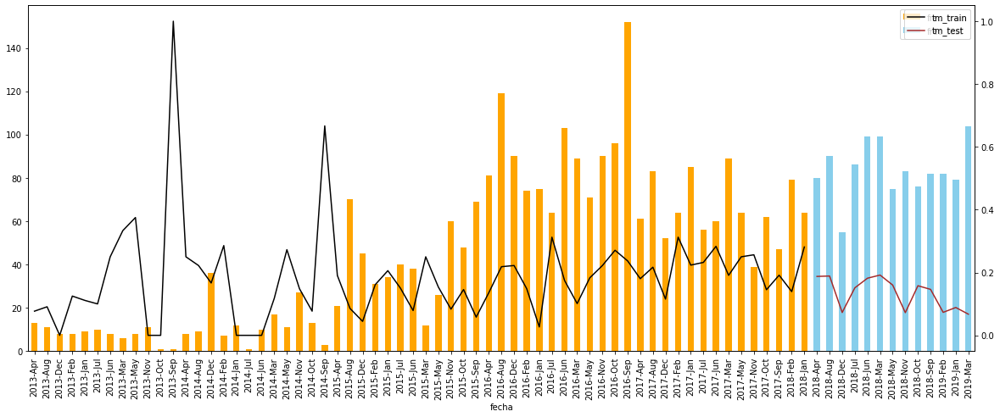

In [252]:
fig, ax = plt.subplots(figsize=(20,7.5))
ax2 = ax.twinx()
df_plot.plot.bar(x = 'fecha', y = 'frec_train', ax = ax, color = 'orange')
df_plot.plot(x = 'fecha', y = 'tm_train', ax = ax2, color = 'black')
df_plot.plot.bar(x = 'fecha', y = 'frec_test', ax = ax, color = 'skyblue')
df_plot.plot(x = 'fecha', y = 'tm_test', ax = ax2, color = 'brown')
plt.show()

In [213]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((3521, 325), (1464, 325), (3521, 1), (1464, 1))

In [214]:
X_train.head(2)

,edad,educacion,estado_civil,vivienda,perfil,carga_fam,ingreso,antiguedad,cuotas_pend,cuotas_canc,...,linea_activa_max1m6_max7m12,por_uso_linea_1m_max2m12,por_uso_linea_max1m3_max4m12,por_uso_linea_max1m6_max7m12,por_uso_efectivo_1m_max2m12,por_uso_efectivo_max1m3_max4m12,por_uso_efectivo_max1m6_max7m12,por_me_1m_max2m12,por_me_max1m3_max4m12,por_me_max1m6_max7m12
0,49,Secundaria completa,Conviviente,ALQUILADO,Independiente - Informal,0.0,NaN,NaN,39,NaN,...,Menor linea_activa,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me
1,36,Secundaria completa,Casado,FAMILIAR,Independiente - Formal,3.0,NaN,NaN,45,NaN,...,Cero linea_activa,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me


In [215]:
X_test.head(2)

,edad,educacion,estado_civil,vivienda,perfil,carga_fam,ingreso,antiguedad,cuotas_pend,cuotas_canc,...,linea_activa_max1m6_max7m12,por_uso_linea_1m_max2m12,por_uso_linea_max1m3_max4m12,por_uso_linea_max1m6_max7m12,por_uso_efectivo_1m_max2m12,por_uso_efectivo_max1m3_max4m12,por_uso_efectivo_max1m6_max7m12,por_me_1m_max2m12,por_me_max1m3_max4m12,por_me_max1m6_max7m12
3555,27,Secundaria completa,Conviviente,ALQUILADO,Taxista propietario,1.0,3461.0,NaN,36,NaN,...,Cero linea_activa,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me
3556,52,Secundaria incompleta,Divorciado,FAMILIAR,Taxista propietario,1.0,3461.0,NaN,48,NaN,...,Cero linea_activa,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_linea,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_uso_efectivo,Cero por_me,Cero por_me,Cero por_me


In [216]:
y_train.mean()

malo    0.176938
dtype: float64

In [217]:
y_test.mean()

malo    0.099727
dtype: float64

## Exploración

In [104]:
X_train[demo].dtypes

edad              int64
educacion        object
estado_civil     object
vivienda         object
perfil           object
carga_fam       float64
ingreso         float64
dtype: object

In [218]:
X_train[demo].describe(percentiles=[.01, .05, .1, .25, .5, .75, .9, .95, .99])

,edad,carga_fam,ingreso
count,3521.000000,3521.000000,2824.000000
mean,36.779892,1.586765,3532.981232
std,10.442081,1.265556,100.949558
min,20.000000,0.000000,1790.000000
1%,21.000000,0.000000,3334.000000
5%,23.000000,0.000000,3461.000000
10%,24.000000,0.000000,3461.000000
25%,28.000000,0.000000,3461.000000
50%,35.000000,2.000000,3597.000000
75%,44.000000,3.000000,3597.000000


In [219]:
X_train[demo].describe(include = 'object')

,educacion,estado_civil,vivienda,perfil
count,3514,3521,3519,3521
unique,8,5,3,7
top,Secundaria completa,Soltero,FAMILIAR,Taxista palanca
freq,3282,1437,2792,2916


### Graficos Demograficas

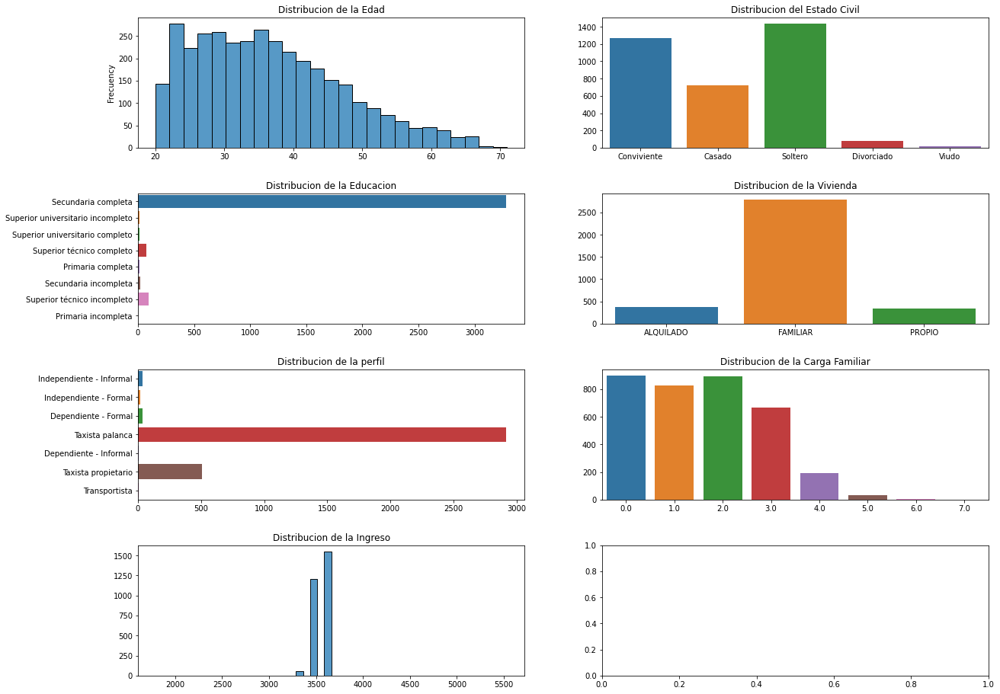

In [220]:
fig, axs = plt.subplots(nrows= 4, ncols=2, figsize=(20,15)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.histplot(data = X_train, x = 'edad', ax=axs[0, 0]).set(title = "Distribucion de la Edad", xlabel=None, ylabel = 'Frecuency')
sns.countplot(data = X_train, x = 'estado_civil', ax=axs[0, 1]).set(title = "Distribucion del Estado Civil", xlabel=None, ylabel= None)
sns.countplot(data = X_train, y = 'educacion', ax=axs[1, 0]).set(title = "Distribucion de la Educacion", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'vivienda', ax=axs[1, 1]).set(title = "Distribucion de la Vivienda", xlabel=None, ylabel= None)
sns.countplot(data = X_train, y = 'perfil', ax=axs[2, 0]).set(title = "Distribucion de la perfil", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'carga_fam', ax=axs[2, 1]).set(title = "Distribucion de la Carga Familiar", xlabel=None, ylabel= None)
sns.histplot(data = X_train, x = 'ingreso', ax=axs[3, 0], bins = 50).set(title = "Distribucion de la Ingreso", xlabel=None, ylabel= None)

pass

In [221]:
dict_dem = {
    'dict_educacion' : {
        "Sin estudios": "SinEst_Prim_Sec",
        "Primaria completa": "SinEst_Prim_Sec",
        "Primaria incompleta": "SinEst_Prim_Sec",
        "Secundaria incompleta": "SinEst_Prim_Sec",
        "Secundaria completa": "SinEst_Prim_Sec",
        "Superior técnico incompleto": "Tecnico",
        "Superior técnico completo": "Tecnico",
        "Superior universitario incompleto": "Univ_Postg",
        "Superior universitario completo": "Univ_Postg",
        "Post-grado incompleto": "Univ_Postg",
        "Post-grado": "Univ_Postg",
        "Post-grado completo": "Univ_Postg"
    },
    'dict_perfil' : {
        "Taxista propietario": "5.Propietario",
        "Mototaxista propietario": "5.Propietario",
        "Transportista": "3.Palanca",
        "Taxista palanca": "3.Palanca",
        "Mototaxista palanca": "3.Palanca",
        "Dependiente - Informal": "4.Depen. Formal",
        "Dependiente - Formal": "4.Depen. Formal",
        "Semidependiente - Formal": "4.Depen. Formal",
        "Dependiente - Semiformal": "4.Depen. Formal",
        "Independiente - Formal": "2.Indep. Formal", 
        "Independiente - Informal": "1.Indep. Infor."
    }
}


In [222]:
X_train = X_train.replace({'educacion': dict_dem['dict_educacion']})
X_train = X_train.replace({'perfil': dict_dem['dict_perfil']})

X_train['carga_fam'] = np.where( np.isnan(X_train['carga_fam']), 'Otros/ NULL/ NA', np.where( X_train['carga_fam'] >= 3, "+3", X_train['carga_fam'] ) )
X_train['carga_fam'] = X_train.replace('Otros/ NULL/ NA',np.nan)['carga_fam']

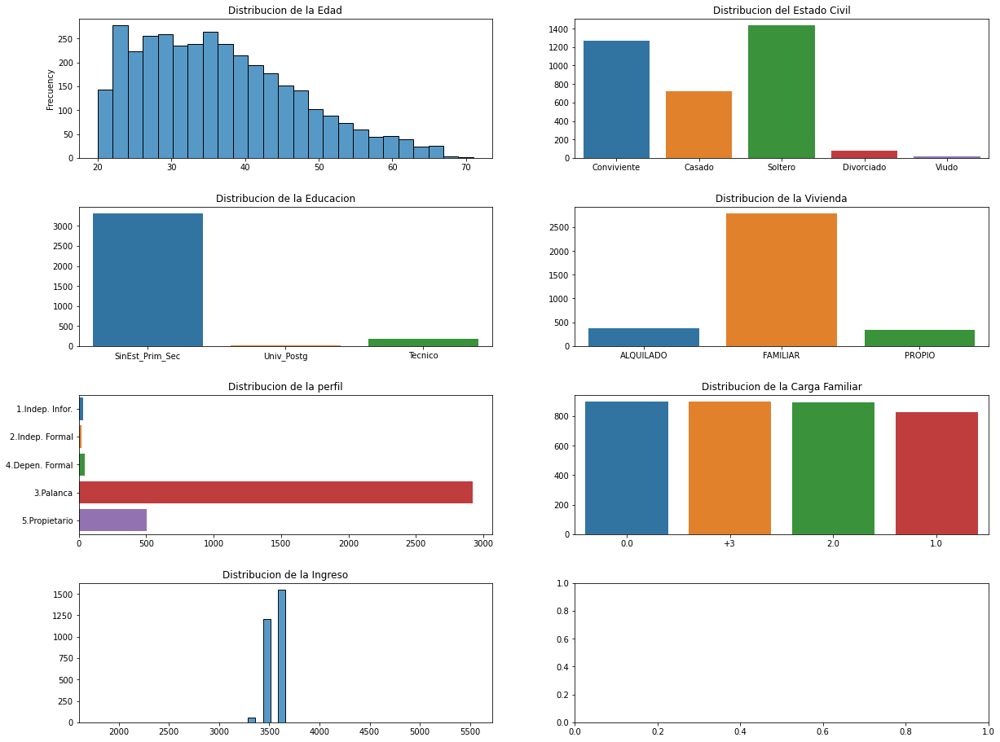

In [223]:
fig, axs = plt.subplots(nrows= 4, ncols=2, figsize=(20,15)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.histplot(data = X_train, x = 'edad', ax=axs[0, 0]).set(title = "Distribucion de la Edad", xlabel=None, ylabel = 'Frecuency')
sns.countplot(data = X_train, x = 'estado_civil', ax=axs[0, 1]).set(title = "Distribucion del Estado Civil", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'educacion', ax=axs[1, 0]).set(title = "Distribucion de la Educacion", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'vivienda', ax=axs[1, 1]).set(title = "Distribucion de la Vivienda", xlabel=None, ylabel= None)
sns.countplot(data = X_train, y = 'perfil', ax=axs[2, 0]).set(title = "Distribucion de la perfil", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'carga_fam', ax=axs[2, 1]).set(title = "Distribucion de la Carga Familiar", xlabel=None, ylabel= None)
sns.histplot(data = X_train, x = 'ingreso', ax=axs[3, 0], bins = 50).set(title = "Distribucion de la Ingreso", xlabel=None, ylabel= None)
pass                                        

In [224]:
X_train[inter].dtypes

antiguedad                  float64
cuotas_pend                   int64
cuotas_canc                 float64
saldo_cap                   float64
saldo_int                   float64
saldo_mora                  float64
provision                   float64
garpref                        bool
cap_vig                     float64
cap_ref                     float64
cap_ven                     float64
cap_jud                     float64
mora_prom1m6                float64
mora                          int64
calificacion_conalin          int64
calificacion_sinalin          int64
sobreend                    float64
riesgocc                    float64
refin                        object
refinanciacion              float64
im_pagcof                   float64
carga_gnv                   float64
nro_carga_gnv               float64
cv_carga_gnv                float64
relacion_im_pagcof_cuota    float64
relacion_carga_gnv_cuota    float64
dtype: object

In [225]:
X_train[inter].describe(percentiles=[.01, .05, .1, .25, .5, .75, .9, .95, .99])

,antiguedad,cuotas_pend,cuotas_canc,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,...,calificacion_sinalin,sobreend,riesgocc,refinanciacion,im_pagcof,carga_gnv,nro_carga_gnv,cv_carga_gnv,relacion_im_pagcof_cuota,relacion_carga_gnv_cuota
count,68.000000,3521.000000,0.0,3521.000000,3521.000000,3521.0,3521.000000,3521.000000,3521.000000,3521.0,...,3521.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,2.955882,48.878160,NaN,39225.551750,23.794019,0.0,2243.575558,39183.028091,42.523658,0.0,...,0.024709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,1.028458,22.718439,NaN,6588.405685,123.083265,0.0,6290.394583,6715.381345,1282.224994,0.0,...,0.241239,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,7.000000,NaN,8731.870000,0.000000,0.0,87.320000,0.000000,0.000000,0.0,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1%,1.000000,30.000000,NaN,23655.000000,0.000000,0.0,242.246000,23314.200000,0.000000,0.0,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5%,2.000000,36.000000,NaN,29022.000000,0.000000,0.0,295.030000,28894.920000,0.000000,0.0,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10%,2.000000,39.000000,NaN,30734.240000,0.000000,0.0,310.660000,30728.130000,0.000000,0.0,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,2.000000,42.000000,NaN,35015.280000,0.000000,0.0,353.720000,35009.420000,0.000000,0.0,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,3.000000,48.000000,NaN,39156.900000,0.000000,0.0,400.320000,39142.000000,0.000000,0.0,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,3.250000,48.000000,NaN,43919.550000,0.000000,0.0,468.280000,43914.640000,0.000000,0.0,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [226]:
X_train[inter].describe(include = 'object')

,refin
count,3521
unique,2
top,False
freq,3517


### Graficos Internas

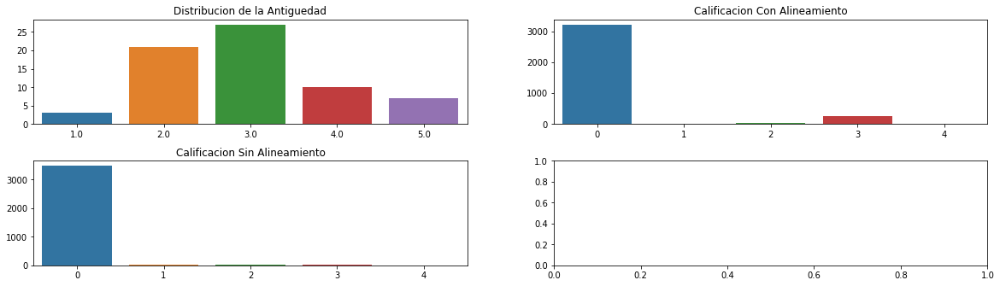

In [116]:
fig, axs = plt.subplots(nrows= 2, ncols=2, figsize=(20,5)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.countplot(data = X_train, x = 'antiguedad', ax=axs[0, 0]).set(title = "Distribucion de la Antiguedad", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'calificacion_conalin', ax=axs[0, 1]).set(title = "Calificacion Con Alineamiento", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'calificacion_sinalin', ax=axs[1, 0]).set(title = "Calificacion Sin Alineamiento", xlabel=None, ylabel= None)

pass

In [84]:
mapping_calificacion = {0: 'Normal', 1: 'CPP', 2: 'Deficiente', 3: 'Dudoso', 4:'Perdida'}
X_train['calificacion_conalin'] = X_train['calificacion_conalin'].map(mapping_calificacion)
X_train['calificacion_sinalin'] = X_train['calificacion_sinalin'].map(mapping_calificacion)

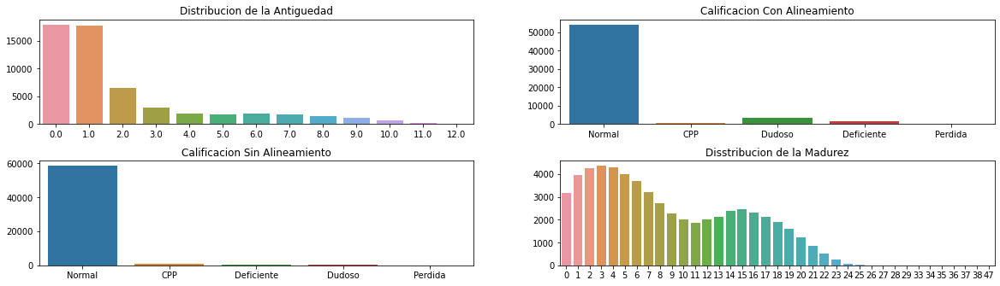

In [85]:
fig, axs = plt.subplots(nrows= 2, ncols=2, figsize=(20,5)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.countplot(data = X_train, x = 'antiguedad', ax=axs[0, 0]).set(title = "Distribucion de la Antiguedad", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'calificacion_conalin', ax=axs[0, 1]).set(title = "Calificacion Con Alineamiento", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'calificacion_sinalin', ax=axs[1, 0]).set(title = "Calificacion Sin Alineamiento", xlabel=None, ylabel= None)
sns.countplot(data = X_train, x = 'madurez', ax=axs[1, 1]).set(title = "Disstribucion de la Madurez", xlabel=None, ylabel= None)

pass

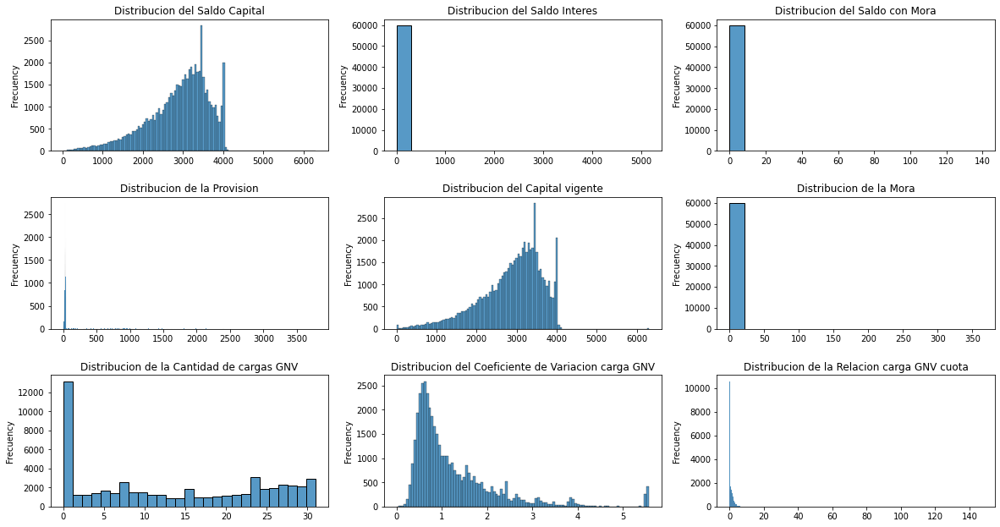

In [86]:
fig, axs = plt.subplots(nrows= 3, ncols=3, figsize=(20,10)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.histplot(data = X_train, x = 'saldo_cap', ax=axs[0, 0]).set(title = "Distribucion del Saldo Capital", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train, x = 'saldo_int', ax=axs[0, 1]).set(title = "Distribucion del Saldo Interes", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train, x = 'saldo_mora', ax=axs[0, 2]).set(title = "Distribucion del Saldo con Mora", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train, x = 'provision', ax=axs[1, 0]).set(title = "Distribucion de la Provision", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train, x = 'cap_vig', ax=axs[1, 1]).set(title = "Distribucion del Capital vigente", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train, x = 'mora', ax=axs[1, 2]).set(title = "Distribucion de la Mora", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train, x = 'nro_carga_gnv', ax=axs[2, 0]).set(title = "Distribucion de la Cantidad de cargas GNV", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train, x = 'cv_carga_gnv', ax=axs[2, 1]).set(title = "Distribucion del Coeficiente de Variacion carga GNV", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train, x = 'relacion_carga_gnv_cuota', ax=axs[2, 2]).set(title = "Distribucion de la Relacion carga GNV cuota", xlabel=None, ylabel = 'Frecuency')

pass

In [87]:
## Imputacion por logica

# Recencia
X_train['rec_calificacion_0_1m12'] = np.where(X_train['rec_calificacion_0_1m12']>= 0, round(X_train['rec_calificacion_0_1m12']).astype('str'), 'Otros')
X_train['rec_calificacion_1234_1m12'] = np.where(X_train['rec_calificacion_1234_1m12'] >= 0, round(X_train['rec_calificacion_1234_1m12']).astype('str'), 'Otros')
X_train['rec_calificacion_234_1m12'] = np.where(X_train['rec_calificacion_234_1m12'] >= 0, round(X_train['rec_calificacion_234_1m12']).astype('str'), 'Otros')
X_train['rec_calificacion_34_1m12'] = np.where(X_train['rec_calificacion_34_1m12'] >= 0, round(X_train['rec_calificacion_34_1m12']).astype('str'), 'Otros')
X_train['rec_calificacion_4_1m12'] = np.where(X_train['rec_calificacion_4_1m12'] >= 0, round(X_train['rec_calificacion_4_1m12']).astype('str'), 'Otros')
X_train['rec_mora_0_1m12'] = np.where(X_train['rec_mora_0_1m12'] >= 0, round(X_train['rec_mora_0_1m12']).astype('str'), 'Otros')
X_train['rec_mora0_1m12'] = np.where(X_train['rec_mora0_1m12'] >= 0, round(X_train['rec_mora0_1m12']).astype('str'), 'Otros')
X_train['rec_mora120_1m12'] = np.where(X_train['rec_mora120_1m12'] >= 0, round(X_train['rec_mora120_1m12']).astype('str'), 'Otros')
X_train['rec_mora30_1m12'] = np.where(X_train['rec_mora30_1m12'] >= 0, round(X_train['rec_mora30_1m12']).astype('str'), 'Otros')
X_train['rec_mora60_1m12'] = np.where(X_train['rec_mora60_1m12'] >= 0, round(X_train['rec_mora60_1m12']).astype('str'), 'Otros')
X_train['rec_mora90_1m12'] = np.where(X_train['rec_mora90_1m12'] >= 0, round(X_train['rec_mora90_1m12']).astype('str'), 'Otros')
X_train['rec_por_cal0_100_1m12'] = np.where(X_train['rec_por_cal0_100_1m12'] >= 0, round(X_train['rec_por_cal0_100_1m12']).astype('str'), 'Otros')
X_train['rec_por_cal4_100_1m12'] = np.where(X_train['rec_por_cal4_100_1m12'] >= 0, round(X_train['rec_por_cal4_100_1m12']).astype('str'), 'Otros')

## Linea y disposicion de efectivo (flag sin o con disposicion de efectivo o linea)
X_train['disp_efectivo_0m_flg'] = np.where(np.isnan(X_train['disp_efectivo_0m']), 'SinEfectivo', 'ConEfectivo')
X_train['disp_efectivo_max1m12_flg'] = np.where(np.isnan(X_train['disp_efectivo_max1m12']), 'SinEfectivo', 'ConEfectivo')
X_train['disp_efectivo_1m_flg'] = np.where(np.isnan(X_train['disp_efectivo_1m']), 'SinEfectivo', 'ConEfectivo')
X_train['disp_efectivo_max1m3_flg'] = np.where(np.isnan(X_train['disp_efectivo_max1m3']), 'SinEfectivo', 'ConEfectivo')
X_train['disp_efectivo_max1m6_flg'] = np.where(np.isnan(X_train['disp_efectivo_max1m6']), 'SinEfectivo', 'ConEfectivo')
X_train['linea_activa_0m_flg'] = np.where(np.isnan(X_train['linea_activa_0m']), 'SinLinea', 'ConLinea')
X_train['linea_activa_1m_flg'] = np.where(np.isnan(X_train['linea_activa_1m']), 'SinLinea', 'ConLinea')
X_train['linea_activa_max1m12_flg'] = np.where(np.isnan(X_train['linea_activa_max1m12']), 'SinLinea', 'ConLinea')
X_train['linea_activa_max1m3_flg'] = np.where(np.isnan(X_train['linea_activa_max1m3']), 'SinLinea', 'ConLinea')
X_train['linea_activa_max1m6_flg'] = np.where(np.isnan(X_train['linea_activa_max1m6']), 'SinLinea', 'ConLinea')
X_train['linea_total_0m_flg'] = np.where(np.isnan(X_train['linea_total_0m']), 'SinLinea', 'ConLinea')
X_train['linea_total_1m_flg'] = np.where(np.isnan(X_train['linea_total_1m']), 'SinLinea', 'ConLinea')
X_train['linea_total_max1m12_flg'] = np.where(np.isnan(X_train['linea_total_max1m12']), 'SinLinea', 'ConLinea')
X_train['linea_total_max1m3_flg'] = np.where(np.isnan(X_train['linea_total_max1m3']), 'SinLinea', 'ConLinea')
X_train['linea_total_max1m6_flg'] = np.where(np.isnan(X_train['linea_total_max1m6']), 'SinLinea', 'ConLinea')
X_train['linea_usada_0m_flg'] = np.where(np.isnan(X_train['linea_usada_0m']), 'SinLinea', 'ConLinea')
X_train['linea_usada_1m_flg'] = np.where(np.isnan(X_train['linea_usada_1m']), 'SinLinea', 'ConLinea')
X_train['linea_usada_max1m12_flg'] = np.where(np.isnan(X_train['linea_usada_max1m12']), 'SinLinea', 'ConLinea')
X_train['linea_usada_max1m3_flg'] = np.where(np.isnan(X_train['linea_usada_max1m3']), 'SinLinea', 'ConLinea')
X_train['linea_usada_max1m6_flg'] = np.where(np.isnan(X_train['linea_usada_max1m6']), 'SinLinea', 'ConLinea')


In [88]:
rcc_new = [
    'disp_efectivo_0m_flg','disp_efectivo_max1m12_flg','disp_efectivo_1m_flg','disp_efectivo_max1m3_flg','disp_efectivo_max1m6_flg','linea_activa_0m_flg','linea_activa_1m_flg','linea_activa_max1m12_flg','linea_activa_max1m3_flg','linea_activa_max1m6_flg','linea_total_0m_flg','linea_total_1m_flg','linea_total_max1m12_flg','linea_total_max1m3_flg','linea_total_max1m6_flg','linea_usada_0m_flg','linea_usada_1m_flg','linea_usada_max1m12_flg','linea_usada_max1m3_flg','linea_usada_max1m6_flg'
]
rcc = np.unique( np.concatenate( (rcc, rcc_new), axis=None) )

In [89]:
X_train.dtypes

antiguedad                 float64
cuotas_pend                  int64
cuotas_canc                float64
saldo_cap                  float64
saldo_int                  float64
                            ...   
linea_usada_0m_flg          object
linea_usada_1m_flg          object
linea_usada_max1m12_flg     object
linea_usada_max1m3_flg      object
linea_usada_max1m6_flg      object
Length: 382, dtype: object

## Tratamiento de valores nulos

<AxesSubplot:>

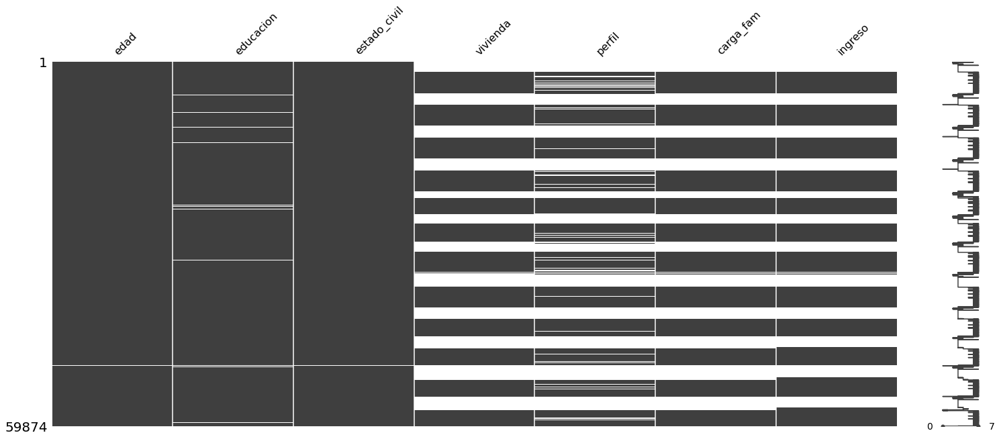

In [90]:
msno.matrix(X_train[demo])

<AxesSubplot:>

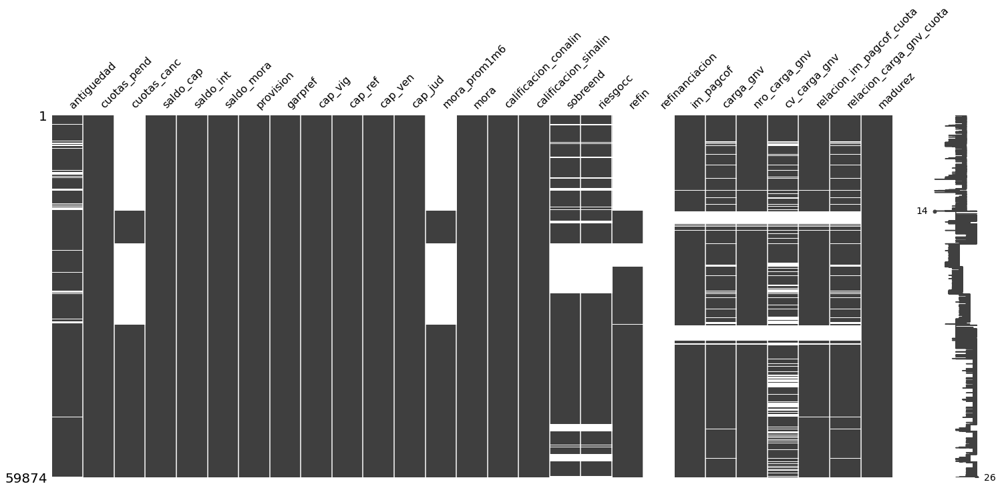

In [91]:
msno.matrix(X_train[inter])

<AxesSubplot:>

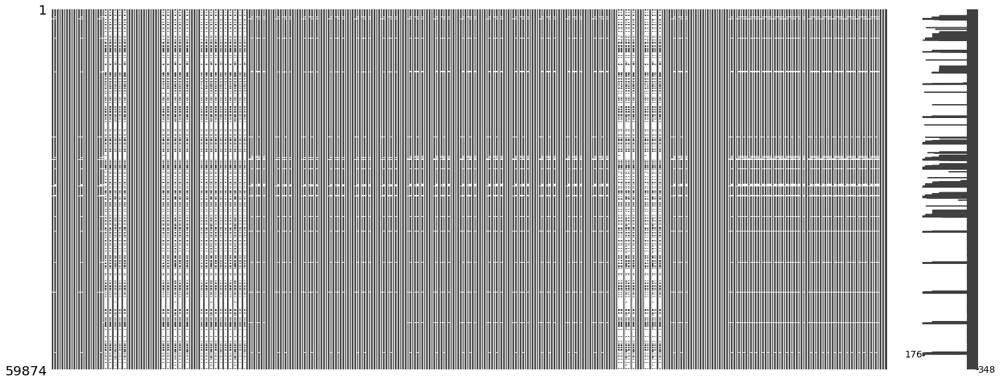

In [92]:
msno.matrix(X_train[rcc])

In [93]:
X_train.select_dtypes('number').head(2)

,antiguedad,cuotas_pend,cuotas_canc,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,...,saldo_castigo_0m,por_castigo_0m,linea_activa_0m,linea_total_0m,linea_usada_0m,por_uso_linea_0m,disp_efectivo_0m,por_uso_efectivo_0m,saldo_me_0m,por_me_0m
0,9.0,24,NaN,2368.38,0.0,0.0,23.68,2368.38,0.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,2.0,24,NaN,2416.65,0.0,0.0,24.17,2416.65,0.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0


In [94]:
X_train.select_dtypes('object').head(2)

,calificacion_conalin,calificacion_sinalin,refin,refinanciacion,educacion,estado_civil,vivienda,perfil,carga_fam,rec_por_cal0_100_1m12,...,linea_total_0m_flg,linea_total_1m_flg,linea_total_max1m12_flg,linea_total_max1m3_flg,linea_total_max1m6_flg,linea_usada_0m_flg,linea_usada_1m_flg,linea_usada_max1m12_flg,linea_usada_max1m3_flg,linea_usada_max1m6_flg
0,Normal,Normal,NaN,NaN,SinEst_Prim_Sec,Casado,NaN,NaN,NaN,1.0,...,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea
1,Normal,Normal,NaN,NaN,SinEst_Prim_Sec,Soltero,NaN,NaN,NaN,1.0,...,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea


In [95]:
X_train_num = X_train.select_dtypes('number')
X_train_cat = X_train.select_dtypes('object')

In [96]:
X_train_num.head(2)

,antiguedad,cuotas_pend,cuotas_canc,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,...,saldo_castigo_0m,por_castigo_0m,linea_activa_0m,linea_total_0m,linea_usada_0m,por_uso_linea_0m,disp_efectivo_0m,por_uso_efectivo_0m,saldo_me_0m,por_me_0m
0,9.0,24,NaN,2368.38,0.0,0.0,23.68,2368.38,0.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,2.0,24,NaN,2416.65,0.0,0.0,24.17,2416.65,0.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0


In [97]:
X_train_cat.head(2)

,calificacion_conalin,calificacion_sinalin,refin,refinanciacion,educacion,estado_civil,vivienda,perfil,carga_fam,rec_por_cal0_100_1m12,...,linea_total_0m_flg,linea_total_1m_flg,linea_total_max1m12_flg,linea_total_max1m3_flg,linea_total_max1m6_flg,linea_usada_0m_flg,linea_usada_1m_flg,linea_usada_max1m12_flg,linea_usada_max1m3_flg,linea_usada_max1m6_flg
0,Normal,Normal,NaN,NaN,SinEst_Prim_Sec,Casado,NaN,NaN,NaN,1.0,...,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea
1,Normal,Normal,NaN,NaN,SinEst_Prim_Sec,Soltero,NaN,NaN,NaN,1.0,...,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea


### Imputación Numéricas

In [98]:
df_num_null = matrix_null(X_train_num)

In [99]:
df_num_null[df_num_null['perc_null'] > .5].head(2)

,frecuency,perc_null
linea_activa_1m,38825,0.6484
linea_total_1m,38630,0.6452


In [100]:
fields_num_null = df_num_null[df_num_null['perc_null'] > 0].index.values

In [101]:
demo_num_null = [i for i in fields_num_null if i in demo]
inter_num_null = [i for i in fields_num_null if i in inter]
rcc_num_null = [i for i in fields_num_null if i in rcc]

In [102]:
matrix_null(X_train_num[demo_num_null])

,frecuency,perc_null
edad,88,0.0015
ingreso,21423,0.3578


### **`Estrategias para imputar demograficas:`**

#### `- La edad posee un bajo porcentaje de nulos, por eso se le imputara por la mediana.`
#### `- La Carga familiar y el ingreso se les imputara por la mediana.`

In [103]:
matrix_null(X_train[inter_num_null])

,frecuency,perc_null
antiguedad,3873,0.0647
cuotas_canc,29274,0.4889
mora_prom1m6,29274,0.4889
sobreend,12827,0.2142
riesgocc,12827,0.2142
im_pagcof,5330,0.0890
carga_gnv,7656,0.1279
nro_carga_gnv,5330,0.0890
cv_carga_gnv,17317,0.2892
relacion_im_pagcof_cuota,5417,0.0905


### **`Estrategias para imputar internas:`**
#### `- Se debe retirar la base refinanciacion y quitamos cuotas canceladas por la relacion con cuotas pendientes.`
#### `- Se imputara con la mediana a las demas variables`

In [104]:
matrix_null(X_train[rcc_num_null]).to_csv('rcc_null.csv')

In [105]:
X_train_num[demo_num_null].describe()

,edad,ingreso
count,59786.000000,38451.000000
mean,40.530040,3444.435484
std,11.008689,902.482055
min,18.000000,1.500000
25%,32.000000,3461.000000
50%,40.000000,3461.000000
75%,49.000000,3461.000000
max,76.000000,30000.000000


In [106]:
X_train_num[inter_num_null].describe()

,antiguedad,cuotas_canc,mora_prom1m6,sobreend,riesgocc,im_pagcof,carga_gnv,nro_carga_gnv,cv_carga_gnv,relacion_im_pagcof_cuota,relacion_carga_gnv_cuota
count,56001.000000,30600.000000,30600.000000,47047.000000,47047.0,54544.000000,52218.000000,54544.000000,42557.000000,54457.000000,52131.000000
mean,1.985857,11.480621,3.228235,0.072417,1.0,73.056198,148.246190,13.385505,1.252582,0.785252,1.280659
std,2.554138,7.462455,7.530159,0.415660,0.0,71.479367,276.903929,10.908596,0.963571,0.855953,1.936308
min,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,6.000000,0.000000,0.000000,1.0,7.007500,21.990000,2.000000,0.618700,0.061500,0.236550
50%,1.000000,11.000000,0.000000,0.000000,1.0,58.480000,83.495000,12.000000,0.911300,0.546300,0.942600
75%,2.000000,16.000000,3.000000,0.000000,1.0,119.220000,192.472500,24.000000,1.578200,1.174700,1.819950
max,12.000000,60.000000,287.000000,9.000000,1.0,1299.910000,22835.000000,31.000000,5.567800,12.450000,147.322600


### **`Estrategias para imputar rcc:`**
#### `- las recencias seran transformadas a categoricas y los nulos seran imputados por "Otros"`
#### `- las lineas seran transformadas a categoricas como Flag con o sin linea o efectivo`
#### `- las demas variables seran imputadas por la moda`

In [107]:
var_num_drop = ['cuotas_canc','sobreend', 'riesgocc']
X_train_num_imputed = X_train_num.drop(var_num_drop ,axis=1)

In [108]:
demo_num_null = [i for i in demo_num_null if i not in var_num_drop]
inter_num_null = [i for i in inter_num_null if i not in var_num_drop]
rcc_num_null = [i for i in rcc_num_null if i not in var_num_drop]

In [109]:
arr_var_num = np.concatenate([demo_num_null + inter_num_null + rcc_num_null], axis=None)

In [110]:
imputer_num = SimpleImputer(strategy='median')

In [111]:
imputer_num.fit(X_train_num[arr_var_num])

SimpleImputer(strategy='median')

In [112]:
imputer_num.statistics_[0:10]

array([4.0000e+01, 3.4610e+03, 1.0000e+00, 0.0000e+00, 5.8480e+01,
       8.3495e+01, 1.2000e+01, 9.1130e-01, 5.4630e-01, 9.4260e-01])

In [113]:
X_train_num_imputed[arr_var_num] = pd.DataFrame(imputer_num.transform(X_train_num[arr_var_num]), columns = X_train_num[arr_var_num].columns, index = X_train_num.index)

In [114]:
matrix_null(X_train_num_imputed).sort_values(by=['perc_null'], ascending = False)

,frecuency,perc_null
antiguedad,0,0.0
saldo_me_max1m12,0,0.0
por_cal1234_max1m12,0,0.0
calificacion_max1m12,0,0.0
saldo_max1m12,0,0.0
...,...,...
saldo_mora30_max1m3,0,0.0
por_mora30_max1m3,0,0.0
saldo_mora0_max1m3,0,0.0
por_mora0_max1m3,0,0.0


In [115]:
X_train_num_imputed.describe(include='all', percentiles=[.01, .05, .1, .25, .5, .75, .9, .95, .99])

,antiguedad,cuotas_pend,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,cap_jud,...,saldo_castigo_0m,por_castigo_0m,linea_activa_0m,linea_total_0m,linea_usada_0m,por_uso_linea_0m,disp_efectivo_0m,por_uso_efectivo_0m,saldo_me_0m,por_me_0m
count,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.0,...,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000
mean,1.922086,43.153305,2894.460580,3.107027,0.022794,113.014312,2891.170850,2.906797,0.382933,0.0,...,574.262952,0.038912,8953.229807,8891.462610,4287.104313,0.620396,494.407871,0.031476,566.795838,0.005850
std,2.482022,17.539081,764.836746,36.623336,0.708285,325.393638,771.699262,85.587420,33.730823,0.0,...,2998.521272,0.138443,21114.023763,20420.015963,11729.891466,0.223170,2857.616060,0.132573,7949.430565,0.054041
min,0.000000,3.000000,12.110000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1%,0.000000,24.000000,651.612100,0.000000,0.000000,7.285140,599.469800,0.000000,0.000000,0.0,...,0.000000,0.000000,353.191300,337.100200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5%,0.000000,24.000000,1391.020000,0.000000,0.000000,15.131300,1376.267500,0.000000,0.000000,0.0,...,0.000000,0.000000,1000.000000,1000.000000,140.632500,0.030065,0.000000,0.000000,0.000000,0.000000
10%,0.000000,24.000000,1814.662000,0.000000,0.000000,19.260000,1807.101000,0.000000,0.000000,0.0,...,0.000000,0.000000,1700.000000,1700.000000,778.790000,0.278230,0.000000,0.000000,0.000000,0.000000
25%,0.000000,24.000000,2465.225000,0.000000,0.000000,25.860000,2463.625000,0.000000,0.000000,0.0,...,0.000000,0.000000,4620.000000,4694.160000,2043.705000,0.646300,0.000000,0.000000,0.000000,0.000000
50%,1.000000,60.000000,3045.480000,0.000000,0.000000,31.611500,3045.015000,0.000000,0.000000,0.0,...,0.000000,0.000000,4620.000000,4694.160000,2043.705000,0.646300,0.000000,0.000000,0.000000,0.000000
75%,2.000000,60.000000,3455.290000,0.000000,0.000000,35.980000,3455.275000,0.000000,0.000000,0.0,...,150.090000,0.003700,4620.000000,4694.160000,2043.705000,0.646300,0.000000,0.000000,0.000000,0.000000


In [116]:
X_train_num_imputed.head(2)

,antiguedad,cuotas_pend,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,cap_jud,...,saldo_castigo_0m,por_castigo_0m,linea_activa_0m,linea_total_0m,linea_usada_0m,por_uso_linea_0m,disp_efectivo_0m,por_uso_efectivo_0m,saldo_me_0m,por_me_0m
0,9.0,24,2368.38,0.0,0.0,23.68,2368.38,0.0,0.0,0.0,...,0.0,0.0,4620.0,4694.16,2043.705,0.6463,0.0,0.0,0.0,0.0
1,2.0,24,2416.65,0.0,0.0,24.17,2416.65,0.0,0.0,0.0,...,0.0,0.0,4620.0,4694.16,2043.705,0.6463,0.0,0.0,0.0,0.0


In [117]:
X_train_cat.head(2)

,calificacion_conalin,calificacion_sinalin,refin,refinanciacion,educacion,estado_civil,vivienda,perfil,carga_fam,rec_por_cal0_100_1m12,...,linea_total_0m_flg,linea_total_1m_flg,linea_total_max1m12_flg,linea_total_max1m3_flg,linea_total_max1m6_flg,linea_usada_0m_flg,linea_usada_1m_flg,linea_usada_max1m12_flg,linea_usada_max1m3_flg,linea_usada_max1m6_flg
0,Normal,Normal,NaN,NaN,SinEst_Prim_Sec,Casado,NaN,NaN,NaN,1.0,...,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea
1,Normal,Normal,NaN,NaN,SinEst_Prim_Sec,Soltero,NaN,NaN,NaN,1.0,...,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea


In [118]:
var = X_train_num_imputed.columns.values
df_li_ls = limites_inf_sup(X_train_num_imputed, var)

In [119]:
df_li_ls

,antiguedad,cuotas_pend,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,cap_jud,...,saldo_castigo_0m,por_castigo_0m,linea_activa_0m,linea_total_0m,linea_usada_0m,por_uso_linea_0m,disp_efectivo_0m,por_uso_efectivo_0m,saldo_me_0m,por_me_0m
li,0.0,24.0,651.6121,0.0000,0.0,0.00,0.00,0.0,0.0,0.0,...,0.0000,0.0,353.1913,337.1002,0.0000,0.0,0.0000,0.0,0.0000,0.0000
ls,12.0,110.0,6303.9600,59.0605,0.7,3782.38,6303.96,0.0,0.0,0.0,...,9352.6249,1.0,109393.0647,104718.9262,55835.5544,1.0,13157.7606,1.0,8795.0456,0.1535


In [120]:
for i in X_train_num_imputed.columns:
    X_train_num_imputed[i] = np.clip(X_train_num_imputed[i], df_li_ls[i][0], df_li_ls[i][1])

In [121]:
X_train_num_imputed.describe(include='all', percentiles=[.01, .05, .1, .25, .5, .75, .9, .95, .99])

,antiguedad,cuotas_pend,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,cap_jud,...,saldo_castigo_0m,por_castigo_0m,linea_activa_0m,linea_total_0m,linea_usada_0m,por_uso_linea_0m,disp_efectivo_0m,por_uso_efectivo_0m,saldo_me_0m,por_me_0m
count,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.0,59874.0,59874.0,...,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000,59874.000000
mean,1.922086,43.177122,2896.666465,1.405858,0.014476,113.014312,2891.170850,0.0,0.0,0.0,...,454.768906,0.038912,8310.896132,8248.673266,3858.590528,0.620396,385.450980,0.031476,133.235065,0.002734
std,2.482022,17.504744,757.864233,7.142821,0.085142,325.393638,771.699262,0.0,0.0,0.0,...,1286.141575,0.138443,15378.819958,14733.300335,7608.561414,0.223170,1786.454909,0.132573,961.056382,0.017912
min,0.000000,24.000000,651.612100,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,353.191300,337.100200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1%,0.000000,24.000000,651.763867,0.000000,0.000000,7.285140,599.469800,0.0,0.0,0.0,...,0.000000,0.000000,353.350951,337.246054,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5%,0.000000,24.000000,1391.020000,0.000000,0.000000,15.131300,1376.267500,0.0,0.0,0.0,...,0.000000,0.000000,1000.000000,1000.000000,140.632500,0.030065,0.000000,0.000000,0.000000,0.000000
10%,0.000000,24.000000,1814.662000,0.000000,0.000000,19.260000,1807.101000,0.0,0.0,0.0,...,0.000000,0.000000,1700.000000,1700.000000,778.790000,0.278230,0.000000,0.000000,0.000000,0.000000
25%,0.000000,24.000000,2465.225000,0.000000,0.000000,25.860000,2463.625000,0.0,0.0,0.0,...,0.000000,0.000000,4620.000000,4694.160000,2043.705000,0.646300,0.000000,0.000000,0.000000,0.000000
50%,1.000000,60.000000,3045.480000,0.000000,0.000000,31.611500,3045.015000,0.0,0.0,0.0,...,0.000000,0.000000,4620.000000,4694.160000,2043.705000,0.646300,0.000000,0.000000,0.000000,0.000000
75%,2.000000,60.000000,3455.290000,0.000000,0.000000,35.980000,3455.275000,0.0,0.0,0.0,...,150.090000,0.003700,4620.000000,4694.160000,2043.705000,0.646300,0.000000,0.000000,0.000000,0.000000


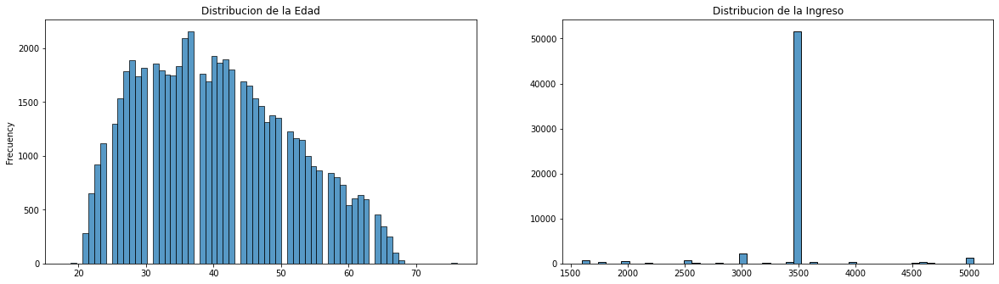

In [122]:
fig, axs = plt.subplots(nrows= 1, ncols=2, figsize=(20,5)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.histplot(data = X_train_num_imputed, x = 'edad', ax=axs[0]).set(title = "Distribucion de la Edad", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'ingreso', ax=axs[1], bins = 50).set(title = "Distribucion de la Ingreso", xlabel=None, ylabel= None)
pass

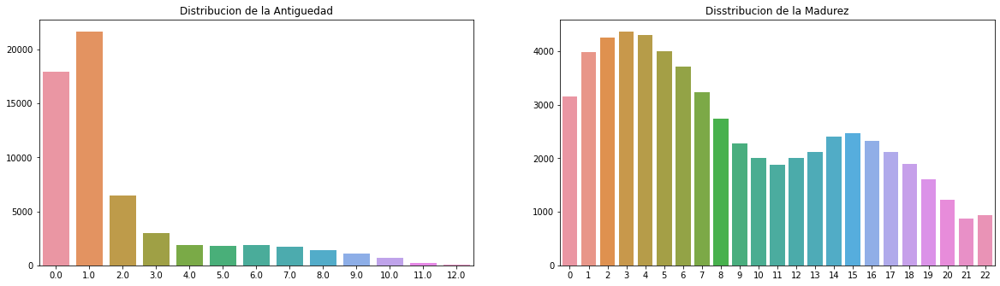

In [123]:
fig, axs = plt.subplots(nrows= 1, ncols=2, figsize=(20,5)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.countplot(data = X_train_num_imputed, x = 'antiguedad', ax=axs[0]).set(title = "Distribucion de la Antiguedad", xlabel=None, ylabel= None)
sns.countplot(data = X_train_num_imputed, x = 'madurez', ax=axs[1]).set(title = "Disstribucion de la Madurez", xlabel=None, ylabel= None)
pass

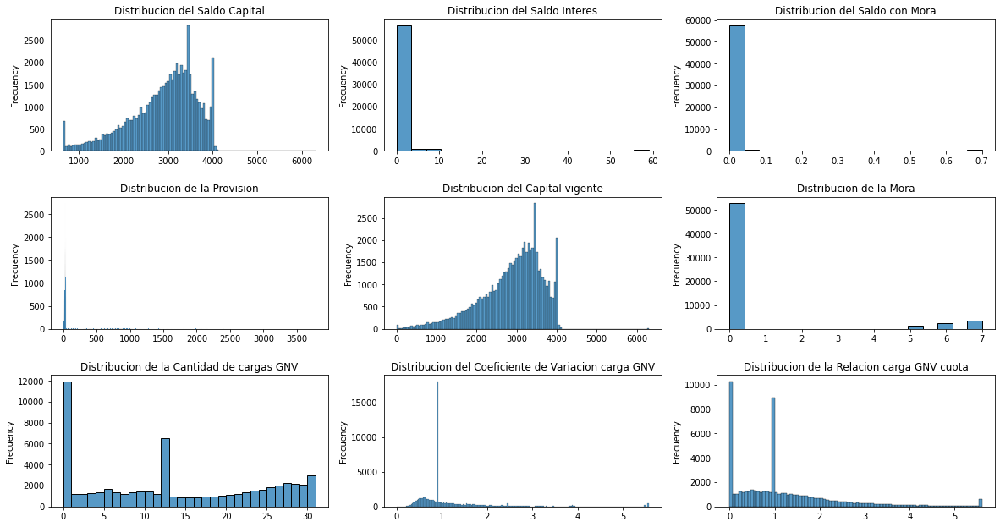

In [124]:
fig, axs = plt.subplots(nrows= 3, ncols=3, figsize=(20,10)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.histplot(data = X_train_num_imputed, x = 'saldo_cap', ax=axs[0, 0]).set(title = "Distribucion del Saldo Capital", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'saldo_int', ax=axs[0, 1]).set(title = "Distribucion del Saldo Interes", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'saldo_mora', ax=axs[0, 2]).set(title = "Distribucion del Saldo con Mora", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'provision', ax=axs[1, 0]).set(title = "Distribucion de la Provision", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'cap_vig', ax=axs[1, 1]).set(title = "Distribucion del Capital vigente", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'mora', ax=axs[1, 2]).set(title = "Distribucion de la Mora", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'nro_carga_gnv', ax=axs[2, 0]).set(title = "Distribucion de la Cantidad de cargas GNV", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'cv_carga_gnv', ax=axs[2, 1]).set(title = "Distribucion del Coeficiente de Variacion carga GNV", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_num_imputed, x = 'relacion_carga_gnv_cuota', ax=axs[2, 2]).set(title = "Distribucion de la Relacion carga GNV cuota", xlabel=None, ylabel = 'Frecuency')
pass

### Imputación Categóricas

In [125]:
df_cat_null = matrix_null(X_train_cat)

In [126]:
df_cat_null[df_cat_null['perc_null'] > 0]

,frecuency,perc_null
refin,19844,0.3314
refinanciacion,59796,0.9987
educacion,1456,0.0243
estado_civil,88,0.0015
vivienda,22651,0.3783
perfil,25644,0.4283
carga_fam,22593,0.3773


In [127]:
fields_cat_null = df_cat_null[df_cat_null['perc_null'] > 0].index.values

In [128]:
demo_cat_null = [i for i in fields_cat_null if i in demo]
inter_cat_null = [i for i in fields_cat_null if i in inter]
rcc_cat_null = [i for i in fields_cat_null if i in rcc]

In [129]:
matrix_null(X_train_cat[demo_cat_null + inter_cat_null])

,frecuency,perc_null
educacion,1456,0.0243
estado_civil,88,0.0015
vivienda,22651,0.3783
perfil,25644,0.4283
carga_fam,22593,0.3773
refin,19844,0.3314
refinanciacion,59796,0.9987


### **`Estrategias para imputar demograficas y RCC:`**
#### `- las variables seran imputadas por la moda`


In [130]:
X_train_cat[demo_cat_null + inter_cat_null].describe(include = 'object')

,educacion,estado_civil,vivienda,perfil,carga_fam,refin,refinanciacion
count,58418,59786,37223,34230,37281,40030,78
unique,3,5,3,6,4,2,2
top,SinEst_Prim_Sec,Soltero,FAMILIAR,Taxista palanca,0.0,False,2020-12-28
freq,46322,35455,26685,24307,18615,39952,42


In [131]:
var_cat_drop = ['refin', 'refinanciacion', 'calificacion_var1m3', 'calificacion_var1m6', 'calificacion_var1m12', 'calificacion_1m_max2m12', 'calificacion_max1m3_max4m12', 'calificacion_max1m6_max7m12']
X_train_cat_2 = X_train_cat.drop(var_cat_drop ,axis=1)

In [132]:
imputer_cat = SimpleImputer(strategy='most_frequent')
imputer_cat.fit(X_train_cat_2)
X_train_cat_imputed = pd.DataFrame(imputer_cat.transform(X_train_cat_2), columns = X_train_cat_2.columns)

X_train_cat_imputed.head(2)

,calificacion_conalin,calificacion_sinalin,educacion,estado_civil,vivienda,perfil,carga_fam,rec_por_cal0_100_1m12,rec_por_cal4_100_1m12,rec_calificacion_0_1m12,...,linea_total_0m_flg,linea_total_1m_flg,linea_total_max1m12_flg,linea_total_max1m3_flg,linea_total_max1m6_flg,linea_usada_0m_flg,linea_usada_1m_flg,linea_usada_max1m12_flg,linea_usada_max1m3_flg,linea_usada_max1m6_flg
0,Normal,Normal,SinEst_Prim_Sec,Casado,FAMILIAR,Taxista palanca,0.0,1.0,Otros,1.0,...,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea
1,Normal,Normal,SinEst_Prim_Sec,Soltero,FAMILIAR,Taxista palanca,0.0,1.0,Otros,1.0,...,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea,SinLinea


In [133]:
matrix_null(X_train_cat_imputed).sort_values(by=['perc_null'], ascending = False)[0:3]

,frecuency,perc_null
calificacion_conalin,0,0.0
calificacion_sinalin,0,0.0
mora_max1m3_max4m12,0,0.0


## Encoding de variables categóricas

In [134]:
X_train_cat_dummies = pd.get_dummies(X_train_cat_imputed, drop_first= True)

In [135]:
X_train_cat_dummies.index=X_train_num_imputed.index

In [136]:
X_train_cat_dummies.head(2)

,calificacion_conalin_Deficiente,calificacion_conalin_Dudoso,calificacion_conalin_Normal,calificacion_conalin_Perdida,calificacion_sinalin_Deficiente,calificacion_sinalin_Dudoso,calificacion_sinalin_Normal,calificacion_sinalin_Perdida,educacion_Tecnico,educacion_Univ_Postg,...,linea_total_0m_flg_SinLinea,linea_total_1m_flg_SinLinea,linea_total_max1m12_flg_SinLinea,linea_total_max1m3_flg_SinLinea,linea_total_max1m6_flg_SinLinea,linea_usada_0m_flg_SinLinea,linea_usada_1m_flg_SinLinea,linea_usada_max1m12_flg_SinLinea,linea_usada_max1m3_flg_SinLinea,linea_usada_max1m6_flg_SinLinea
0,0,0,1,0,0,0,1,0,0,0,...,1,1,1,1,1,1,1,1,1,1
1,0,0,1,0,0,0,1,0,0,0,...,1,1,1,1,1,1,1,1,1,1


## Consolidamos

In [137]:
X_train_cat_dummies.head(2)

,calificacion_conalin_Deficiente,calificacion_conalin_Dudoso,calificacion_conalin_Normal,calificacion_conalin_Perdida,calificacion_sinalin_Deficiente,calificacion_sinalin_Dudoso,calificacion_sinalin_Normal,calificacion_sinalin_Perdida,educacion_Tecnico,educacion_Univ_Postg,...,linea_total_0m_flg_SinLinea,linea_total_1m_flg_SinLinea,linea_total_max1m12_flg_SinLinea,linea_total_max1m3_flg_SinLinea,linea_total_max1m6_flg_SinLinea,linea_usada_0m_flg_SinLinea,linea_usada_1m_flg_SinLinea,linea_usada_max1m12_flg_SinLinea,linea_usada_max1m3_flg_SinLinea,linea_usada_max1m6_flg_SinLinea
0,0,0,1,0,0,0,1,0,0,0,...,1,1,1,1,1,1,1,1,1,1
1,0,0,1,0,0,0,1,0,0,0,...,1,1,1,1,1,1,1,1,1,1


In [138]:
X_train_num_imputed.head(2)

,antiguedad,cuotas_pend,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,cap_jud,...,saldo_castigo_0m,por_castigo_0m,linea_activa_0m,linea_total_0m,linea_usada_0m,por_uso_linea_0m,disp_efectivo_0m,por_uso_efectivo_0m,saldo_me_0m,por_me_0m
0,9.0,24,2368.38,0.0,0.0,23.68,2368.38,0.0,0.0,0.0,...,0.0,0.0,4620.0,4694.16,2043.705,0.6463,0.0,0.0,0.0,0.0
1,2.0,24,2416.65,0.0,0.0,24.17,2416.65,0.0,0.0,0.0,...,0.0,0.0,4620.0,4694.16,2043.705,0.6463,0.0,0.0,0.0,0.0


In [139]:
X_train_cat_dummies.shape

(59874, 656)

In [140]:
X_train_num_imputed.shape

(59874, 210)

In [141]:
X_train_total = pd.concat([X_train_num_imputed, X_train_cat_dummies], axis = 1)

In [142]:
X_train_total.head(2)

,antiguedad,cuotas_pend,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,cap_jud,...,linea_total_0m_flg_SinLinea,linea_total_1m_flg_SinLinea,linea_total_max1m12_flg_SinLinea,linea_total_max1m3_flg_SinLinea,linea_total_max1m6_flg_SinLinea,linea_usada_0m_flg_SinLinea,linea_usada_1m_flg_SinLinea,linea_usada_max1m12_flg_SinLinea,linea_usada_max1m3_flg_SinLinea,linea_usada_max1m6_flg_SinLinea
0,9.0,24,2368.38,0.0,0.0,23.68,2368.38,0.0,0.0,0.0,...,1,1,1,1,1,1,1,1,1,1
1,2.0,24,2416.65,0.0,0.0,24.17,2416.65,0.0,0.0,0.0,...,1,1,1,1,1,1,1,1,1,1


In [143]:
matrix_null(X_train_total).sort_values(by=['perc_null'], ascending = False)[0:5]

,frecuency,perc_null
antiguedad,0,0.0
linea_activa_var1m12_Menor linea_activa,0,0.0
por_castigo_var1m12_Igual por_castigo,0,0.0
por_castigo_var1m12_Mayor por_castigo,0,0.0
por_castigo_var1m12_Menor por_castigo,0,0.0


## Estandarización

In [144]:
scaler = MinMaxScaler()

In [145]:
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train_total), columns = X_train_total.columns)

In [146]:
X_train_total.head()

,antiguedad,cuotas_pend,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,cap_jud,...,linea_total_0m_flg_SinLinea,linea_total_1m_flg_SinLinea,linea_total_max1m12_flg_SinLinea,linea_total_max1m3_flg_SinLinea,linea_total_max1m6_flg_SinLinea,linea_usada_0m_flg_SinLinea,linea_usada_1m_flg_SinLinea,linea_usada_max1m12_flg_SinLinea,linea_usada_max1m3_flg_SinLinea,linea_usada_max1m6_flg_SinLinea
0,9.0,24,2368.38,0.0,0.0,23.68,2368.38,0.0,0.0,0.0,...,1,1,1,1,1,1,1,1,1,1
1,2.0,24,2416.65,0.0,0.0,24.17,2416.65,0.0,0.0,0.0,...,1,1,1,1,1,1,1,1,1,1
2,1.0,24,2552.80,0.0,0.0,25.53,2552.80,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,4.0,24,2773.96,0.0,0.0,27.74,2773.96,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,1.0,24,2263.53,0.0,0.0,22.64,2263.53,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [147]:
X_train_scaled.head()

,antiguedad,cuotas_pend,saldo_cap,saldo_int,saldo_mora,provision,cap_vig,cap_ref,cap_ven,cap_jud,...,linea_total_0m_flg_SinLinea,linea_total_1m_flg_SinLinea,linea_total_max1m12_flg_SinLinea,linea_total_max1m3_flg_SinLinea,linea_total_max1m6_flg_SinLinea,linea_usada_0m_flg_SinLinea,linea_usada_1m_flg_SinLinea,linea_usada_max1m12_flg_SinLinea,linea_usada_max1m3_flg_SinLinea,linea_usada_max1m6_flg_SinLinea
0,0.750000,0.0,0.303727,0.0,0.0,0.006261,0.375697,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,0.166667,0.0,0.312266,0.0,0.0,0.006390,0.383354,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,0.083333,0.0,0.336354,0.0,0.0,0.006750,0.404952,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.333333,0.0,0.375481,0.0,0.0,0.007334,0.440035,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.083333,0.0,0.285177,0.0,0.0,0.005986,0.359065,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


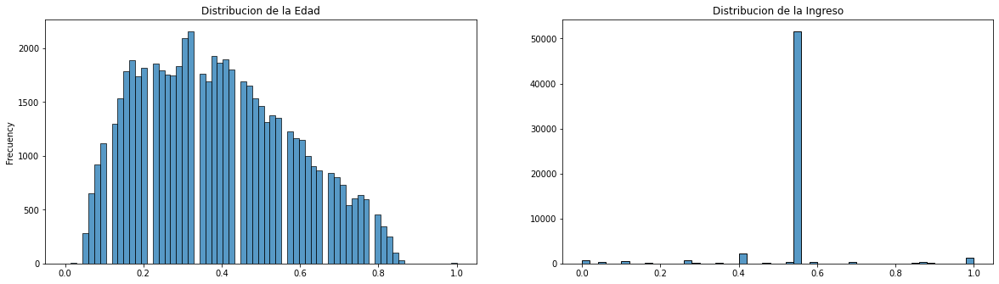

In [148]:
fig, axs = plt.subplots(nrows= 1, ncols=2, figsize=(20,5)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.histplot(data = X_train_scaled, x = 'edad', ax=axs[0]).set(title = "Distribucion de la Edad", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'ingreso', ax=axs[1], bins = 50).set(title = "Distribucion de la Ingreso", xlabel=None, ylabel= None)
pass

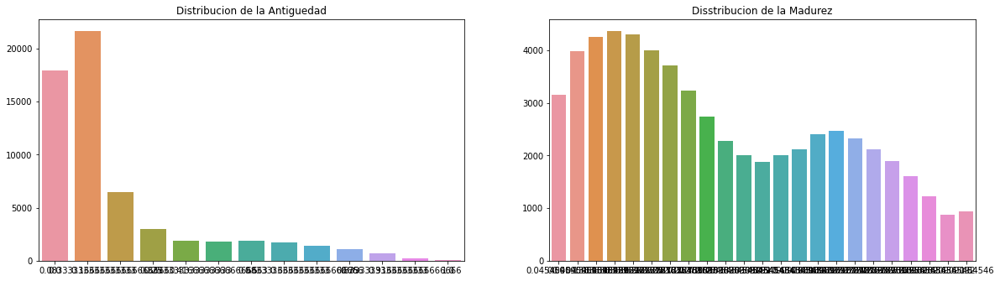

In [149]:
fig, axs = plt.subplots(nrows= 1, ncols=2, figsize=(20,5)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.countplot(data = X_train_scaled, x = 'antiguedad', ax=axs[0]).set(title = "Distribucion de la Antiguedad", xlabel=None, ylabel= None)
sns.countplot(data = X_train_scaled, x = 'madurez', ax=axs[1]).set(title = "Disstribucion de la Madurez", xlabel=None, ylabel= None)
pass

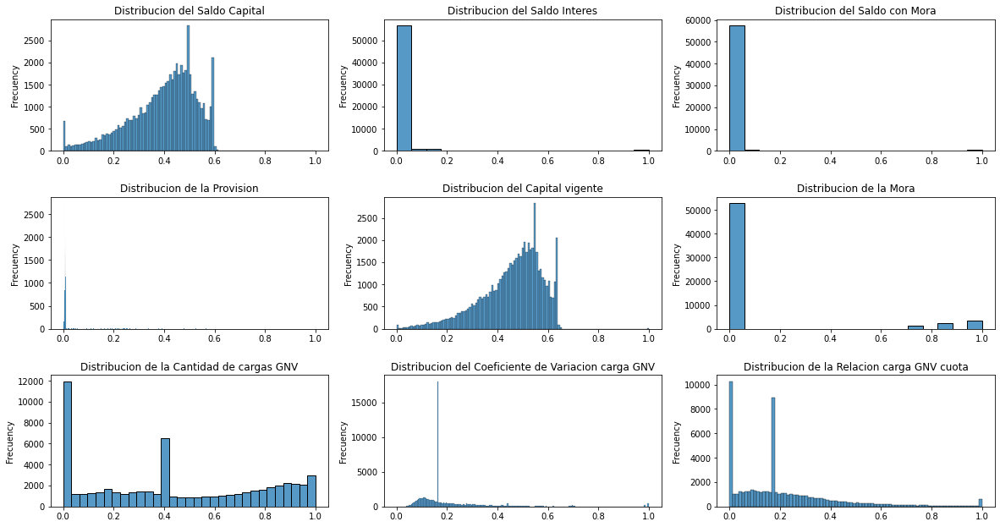

In [150]:
fig, axs = plt.subplots(nrows= 3, ncols=3, figsize=(20,10)) # figsize: ancho x alto
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

sns.histplot(data = X_train_scaled, x = 'saldo_cap', ax=axs[0, 0]).set(title = "Distribucion del Saldo Capital", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'saldo_int', ax=axs[0, 1]).set(title = "Distribucion del Saldo Interes", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'saldo_mora', ax=axs[0, 2]).set(title = "Distribucion del Saldo con Mora", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'provision', ax=axs[1, 0]).set(title = "Distribucion de la Provision", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'cap_vig', ax=axs[1, 1]).set(title = "Distribucion del Capital vigente", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'mora', ax=axs[1, 2]).set(title = "Distribucion de la Mora", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'nro_carga_gnv', ax=axs[2, 0]).set(title = "Distribucion de la Cantidad de cargas GNV", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'cv_carga_gnv', ax=axs[2, 1]).set(title = "Distribucion del Coeficiente de Variacion carga GNV", xlabel=None, ylabel = 'Frecuency')
sns.histplot(data = X_train_scaled, x = 'relacion_carga_gnv_cuota', ax=axs[2, 2]).set(title = "Distribucion de la Relacion carga GNV cuota", xlabel=None, ylabel = 'Frecuency')
pass

In [151]:
# X_train_scaled.to_csv('train_scaled.csv')

## Repetir todo el preprocesamiento para el conjunto de test

In [152]:
X_test = X_test.replace({'educacion': dict_dem['dict_educacion']})
X_test = X_test.replace({'educacion': dict_dem['dict_perfil']}) # Error

X_test['carga_fam'] = np.where( np.isnan(X_test['carga_fam']), 'Otros/ NULL/ NA', np.where( X_test['carga_fam'] >= 3, "+3", X_test['carga_fam'] ) )
X_test['carga_fam'] = X_test.replace('Otros/ NULL/ NA',np.nan)['carga_fam']

In [153]:
X_test['calificacion_conalin'] = X_test['calificacion_conalin'].map(mapping_calificacion)
X_test['calificacion_sinalin'] = X_test['calificacion_sinalin'].map(mapping_calificacion)

In [154]:
## Imputacion por logica

# Recencia
X_test['rec_calificacion_0_1m12'] = np.where(X_test['rec_calificacion_0_1m12']>= 0, round(X_test['rec_calificacion_0_1m12']).astype('str'), 'Otros')
X_test['rec_calificacion_1234_1m12'] = np.where(X_test['rec_calificacion_1234_1m12'] >= 0, round(X_test['rec_calificacion_1234_1m12']).astype('str'), 'Otros')
X_test['rec_calificacion_234_1m12'] = np.where(X_test['rec_calificacion_234_1m12'] >= 0, round(X_test['rec_calificacion_234_1m12']).astype('str'), 'Otros')
X_test['rec_calificacion_34_1m12'] = np.where(X_test['rec_calificacion_34_1m12'] >= 0, round(X_test['rec_calificacion_34_1m12']).astype('str'), 'Otros')
X_test['rec_calificacion_4_1m12'] = np.where(X_test['rec_calificacion_4_1m12'] >= 0, round(X_test['rec_calificacion_4_1m12']).astype('str'), 'Otros')
X_test['rec_mora_0_1m12'] = np.where(X_test['rec_mora_0_1m12'] >= 0, round(X_test['rec_mora_0_1m12']).astype('str'), 'Otros')
X_test['rec_mora0_1m12'] = np.where(X_test['rec_mora0_1m12'] >= 0, round(X_test['rec_mora0_1m12']).astype('str'), 'Otros')
X_test['rec_mora120_1m12'] = np.where(X_test['rec_mora120_1m12'] >= 0, round(X_test['rec_mora120_1m12']).astype('str'), 'Otros')
X_test['rec_mora30_1m12'] = np.where(X_test['rec_mora30_1m12'] >= 0, round(X_test['rec_mora30_1m12']).astype('str'), 'Otros')
X_test['rec_mora60_1m12'] = np.where(X_test['rec_mora60_1m12'] >= 0, round(X_test['rec_mora60_1m12']).astype('str'), 'Otros')
X_test['rec_mora90_1m12'] = np.where(X_test['rec_mora90_1m12'] >= 0, round(X_test['rec_mora90_1m12']).astype('str'), 'Otros')
X_test['rec_por_cal0_100_1m12'] = np.where(X_test['rec_por_cal0_100_1m12'] >= 0, round(X_test['rec_por_cal0_100_1m12']).astype('str'), 'Otros')
X_test['rec_por_cal4_100_1m12'] = np.where(X_test['rec_por_cal4_100_1m12'] >= 0, round(X_test['rec_por_cal4_100_1m12']).astype('str'), 'Otros')

## Linea y disposicion de efectivo (flag sin o con disposicion de efectivo o linea)
X_test['disp_efectivo_0m_flg'] = np.where(np.isnan(X_test['disp_efectivo_0m']), 'SinEfectivo', 'ConEfectivo')
X_test['disp_efectivo_max1m12_flg'] = np.where(np.isnan(X_test['disp_efectivo_max1m12']), 'SinEfectivo', 'ConEfectivo')
X_test['disp_efectivo_1m_flg'] = np.where(np.isnan(X_test['disp_efectivo_1m']), 'SinEfectivo', 'ConEfectivo')
X_test['disp_efectivo_max1m3_flg'] = np.where(np.isnan(X_test['disp_efectivo_max1m3']), 'SinEfectivo', 'ConEfectivo')
X_test['disp_efectivo_max1m6_flg'] = np.where(np.isnan(X_test['disp_efectivo_max1m6']), 'SinEfectivo', 'ConEfectivo')
X_test['linea_activa_0m_flg'] = np.where(np.isnan(X_test['linea_activa_0m']), 'SinLinea', 'ConLinea')
X_test['linea_activa_1m_flg'] = np.where(np.isnan(X_test['linea_activa_1m']), 'SinLinea', 'ConLinea')
X_test['linea_activa_max1m12_flg'] = np.where(np.isnan(X_test['linea_activa_max1m12']), 'SinLinea', 'ConLinea')
X_test['linea_activa_max1m3_flg'] = np.where(np.isnan(X_test['linea_activa_max1m3']), 'SinLinea', 'ConLinea')
X_test['linea_activa_max1m6_flg'] = np.where(np.isnan(X_test['linea_activa_max1m6']), 'SinLinea', 'ConLinea')
X_test['linea_total_0m_flg'] = np.where(np.isnan(X_test['linea_total_0m']), 'SinLinea', 'ConLinea')
X_test['linea_total_1m_flg'] = np.where(np.isnan(X_test['linea_total_1m']), 'SinLinea', 'ConLinea')
X_test['linea_total_max1m12_flg'] = np.where(np.isnan(X_test['linea_total_max1m12']), 'SinLinea', 'ConLinea')
X_test['linea_total_max1m3_flg'] = np.where(np.isnan(X_test['linea_total_max1m3']), 'SinLinea', 'ConLinea')
X_test['linea_total_max1m6_flg'] = np.where(np.isnan(X_test['linea_total_max1m6']), 'SinLinea', 'ConLinea')
X_test['linea_usada_0m_flg'] = np.where(np.isnan(X_test['linea_usada_0m']), 'SinLinea', 'ConLinea')
X_test['linea_usada_1m_flg'] = np.where(np.isnan(X_test['linea_usada_1m']), 'SinLinea', 'ConLinea')
X_test['linea_usada_max1m12_flg'] = np.where(np.isnan(X_test['linea_usada_max1m12']), 'SinLinea', 'ConLinea')
X_test['linea_usada_max1m3_flg'] = np.where(np.isnan(X_test['linea_usada_max1m3']), 'SinLinea', 'ConLinea')
X_test['linea_usada_max1m6_flg'] = np.where(np.isnan(X_test['linea_usada_max1m6']), 'SinLinea', 'ConLinea')

In [155]:
X_test_num = X_test.select_dtypes('number')
X_test_cat = X_test.select_dtypes('object')

In [156]:
X_test_num_imputed = X_test_num.drop(var_num_drop ,axis=1)

In [157]:
X_test_num_imputed[arr_var_num] = pd.DataFrame(imputer_num.transform(X_test_num[arr_var_num]), columns = X_test_num[arr_var_num].columns, index = X_test_num.index)

In [158]:
for i in X_test_num_imputed.columns:
    X_test_num_imputed[i] = np.clip(X_test_num_imputed[i], df_li_ls[i][0], df_li_ls[i][1])

In [159]:
X_test_cat_2 = X_test_cat.drop(var_cat_drop ,axis=1)

In [160]:
X_test_cat_imputed = pd.DataFrame(imputer_cat.transform(X_test_cat_2), columns = X_test_cat_2.columns)

In [161]:
X_test_cat_dummies = pd.get_dummies(X_test_cat_imputed, drop_first= True)

In [162]:
X_test_cat_dummies.index=X_test_num_imputed.index

In [163]:
X_test_total = pd.concat([X_test_num_imputed, X_test_cat_dummies], axis = 1)

In [164]:
X_test_scaled = pd.DataFrame(scaler.fit_transform(X_test_total), columns = X_test_total.columns)

In [165]:
# X_test_scaled.to_csv('test_scaled.csv')

In [166]:
X_train_scaled.shape, X_test_scaled.shape, y_train.shape, y_test.shape 

((59874, 866), (23840, 866), (59874, 1), (23840, 1))

In [167]:
# pd.DataFrame(X_train_scaled.columns.values).to_csv("var_train.csv")
# pd.DataFrame(X_test_scaled.columns.values).to_csv("var_test.csv")
# [i for i in X_test_scaled.columns.values if i not in X_train_scaled.columns.values]

In [168]:
# pd.DataFrame([i for i in X_train_scaled.columns.values if i not in X_test_scaled.columns.values]).to_csv("var.csv")
# [i for i in X_train_scaled.columns.values if i not in X_test_scaled.columns.values]

## Balanceo de datos

In [169]:
df_target = y_train
df_target['target'] = np.where(df_target['tm']==0,'no','si')

In [170]:
df_target.head(2)

,tm,target
0,0,no
1,0,no


In [171]:
df_target.groupby(['target','tm'])['target'].count()

target  tm
no      0     56355
si      1      3519
Name: target, dtype: int64

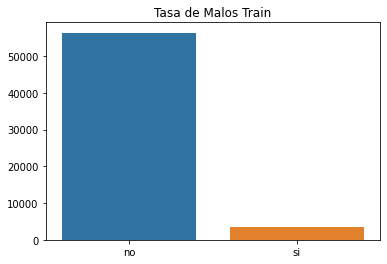

In [172]:
sns.countplot(data = df_target, x = 'target').set(title = "Tasa de Malos Train", xlabel=None, ylabel= None)
pass

In [173]:
y_train = df_target.drop(['target'], axis=1)

In [174]:
rus = RandomUnderSampler(sampling_strategy = 0.8, random_state = seed)
ros = RandomOverSampler(sampling_strategy = 0.8, random_state = seed)

In [175]:
X_rus, y_rus = rus.fit_resample(X_train_scaled, y_train)
X_ros, y_ros = ros.fit_resample(X_train_scaled, y_train)

In [176]:
y_rus.value_counts()

tm
0     4398
1     3519
dtype: int64

In [177]:
y_ros.value_counts()

tm
0     56355
1     45084
dtype: int64

In [178]:
df_target_rus = y_rus
df_target_rus['target'] = np.where(df_target_rus['tm']==0,'no','si')

df_target_ros = y_ros
df_target_ros['target'] = np.where(df_target_ros['tm']==0,'no','si')

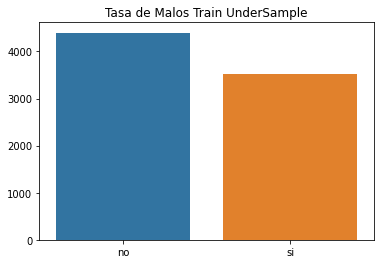

In [179]:
sns.countplot(data = df_target_rus, x = 'target').set(title = "Tasa de Malos Train UnderSample", xlabel=None, ylabel= None)
pass

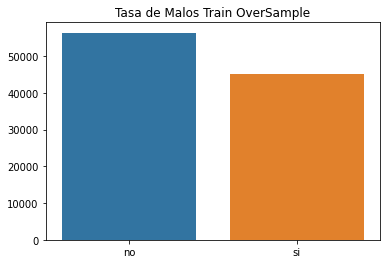

In [180]:
sns.countplot(data = df_target_ros, x = 'target').set(title = "Tasa de Malos Train OverSample", xlabel=None, ylabel= None)
pass

In [181]:
y_rus = df_target_rus.drop(['target'], axis=1)
y_ros = df_target_ros.drop(['target'], axis=1)

## Entrenar el modelo

### Random Forest

In [148]:
rf_params = {'criterion': ['gini', 'entropy'],
          'max_depth': [5, 10],
          'min_samples_split': [10, 25, 50],
          'n_estimators': [25, 50, 100],
          'random_state': [seed]}

In [149]:
rf = RandomForestClassifier()

In [155]:
gs = GridSearchCV(estimator = rf, param_grid = rf_params, scoring = 'roc_auc')
gs_rus = GridSearchCV(estimator = rf, param_grid = rf_params, scoring = 'roc_auc')
gs_ros = GridSearchCV(estimator = rf, param_grid = rf_params, scoring = 'roc_auc')

In [151]:
gs.fit(X_train_scaled, y_train)

KeyboardInterrupt: 

In [ ]:
gs.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_split=25,
                       random_state=314159)

In [ ]:
gs.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_split': 25,
 'n_estimators': 100,
 'random_state': 314159}

In [ ]:
gs.best_score_

0.8703901161550609

In [156]:
gs_rus.fit(X_rus, y_rus)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [5, 10],
                         'min_samples_split': [10, 25, 50],
                         'n_estimators': [25, 50, 100],
                         'random_state': [314159]},
             scoring='roc_auc')

In [157]:
gs_rus.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_split=25,
                       random_state=314159)

In [158]:
gs_rus.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_split': 25,
 'n_estimators': 100,
 'random_state': 314159}

In [159]:
gs_rus.best_score_

0.8696108922739926

In [160]:
joblib.dump(gs_rus, 'rf_rus_conversion.pkl') # Guardo el modelo.

['rf_rus_conversion.pkl']

In [182]:
gs_rus_load = joblib.load('rf_rus_conversion.pkl') # Carga del modelo.

In [183]:
gs_rus_load.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_split=25,
                       random_state=314159)

In [184]:
gs_rus_load.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_split': 25,
 'n_estimators': 100,
 'random_state': 314159}

In [185]:
gs_rus_load.best_score_

0.8696108922739926

In [ ]:
gs_ros.fit(X_ros, y_ros)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [5, 10],
                         'min_samples_split': [10, 25, 50],
                         'n_estimators': [25, 50, 100],
                         'random_state': [314159]},
             scoring='roc_auc')

In [ ]:
gs_ros.best_estimator_

RandomForestClassifier(max_depth=10, min_samples_split=10, random_state=314159)

In [ ]:
gs_ros.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_split': 10,
 'n_estimators': 100,
 'random_state': 314159}

In [ ]:
gs_ros.best_score_

0.929340721245782

### usamos el mejor random forest para evaluar el test

In [161]:
best_rf = gs_rus.best_estimator_

In [162]:
y_test_pred_proba = best_rf.predict_proba(X_test_scaled)[:,1]

In [163]:
roc_auc_score(y_test, y_test_pred_proba)

0.7903988483910072

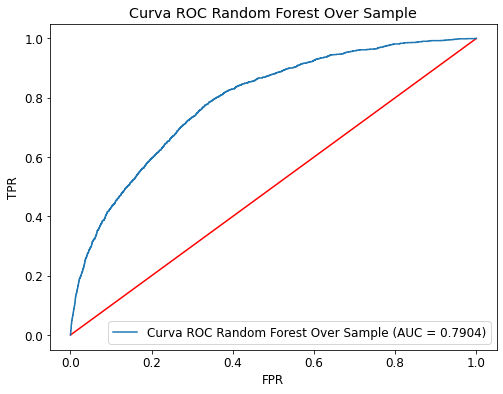

In [164]:
plot_roc_curve(y_test, y_test_pred_proba, 'Random Forest Over Sample')

In [186]:
best_rf_load = gs_rus_load.best_estimator_
y_test_pred_proba_load = best_rf_load.predict_proba(X_test_scaled)[:,1]
roc_auc_score(y_test, y_test_pred_proba_load)

0.7903988483910072

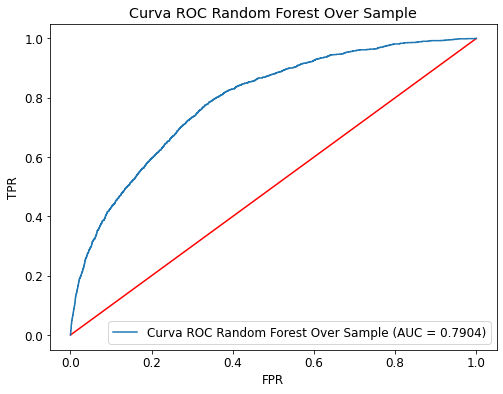

In [187]:
plot_roc_curve(y_test, y_test_pred_proba_load, 'Random Forest Over Sample')

In [ ]:
df_total = pd.concat([X_train_scaled,X_test_scaled], axis = 0)

In [ ]:
pd_org = gs.best_estimator_.predict_proba(df_total)[:,1]
pd_rus = gs_rus.best_estimator_.predict_proba(df_total)[:,1]
pd_ros = gs_ros.best_estimator_.predict_proba(df_total)[:,1]

In [ ]:
df_total['pd_org'] = pd_org
df_total['pd_rus'] = pd_rus
df_total['pd_ros'] = pd_ros

In [ ]:
conversion.shape

(83714, 367)

In [ ]:
df_total.shape

(83714, 869)

In [ ]:
df_total.index = conversion.index

In [ ]:
conversion_final = pd.concat([conversion[ax + target], df_total[['pd_org', 'pd_rus', 'pd_ros']]], axis = 1)

In [ ]:
conversion_final['fecha'] = [datetime.datetime.strptime(str(i), "%Y%m").strftime("%Y-%b") for i in conversion_final['stock']]

In [ ]:
conversion_final.head(2)

,stock,cod,cv,producto,tm,pd_org,pd_rus,pd_ros,fecha
0,201910,201910G0002961,G0002961,Conversion,0,0.016530,0.145941,0.139197,2019-Oct
1,201910,201910G0002963,G0002963,Conversion,0,0.012922,0.121163,0.120920,2019-Oct


In [ ]:
frecuency = conversion_final.groupby(['fecha'])['cod'].count()
tm_pd_mean = conversion_final.groupby(['fecha'])[['tm', 'pd_org', 'pd_rus', 'pd_ros']].mean()
df_plot = pd.concat([frecuency, tm_pd_mean], axis = 1)
df_plot['fecha'] = df_plot.index

In [ ]:
df_plot.dtypes

cod         int64
tm        float64
pd_org    float64
pd_rus    float64
pd_ros    float64
fecha      object
dtype: object

In [ ]:
df_plot.head(2)

,cod,tm,pd_org,pd_rus,pd_ros,fecha
fecha,,,,,,
2019-Aug,4458,0.030283,0.033354,0.222965,0.186123,2019-Aug
2019-Dec,5315,0.032926,0.042704,0.256916,0.224419,2019-Dec


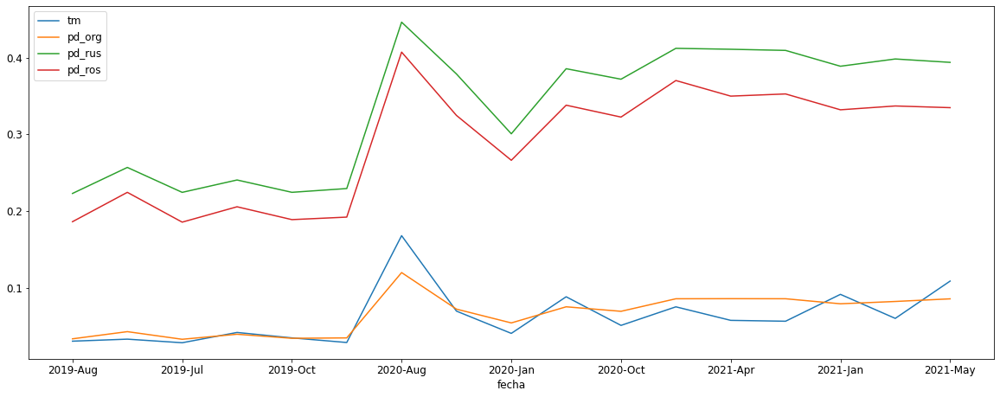

In [ ]:
fig, ax = plt.subplots(figsize=(20,7.5))
df_plot.plot(x = 'fecha', y = 'tm', ax = ax)
df_plot.plot(x = 'fecha', y = 'pd_org', ax = ax)
df_plot.plot(x = 'fecha', y = 'pd_rus', ax = ax)
df_plot.plot(x = 'fecha', y = 'pd_ros', ax = ax)
plt.show()

In [ ]:
conversion_final.to_csv('base_final.csv')